**HUMAN ACTIVITY RECOGNITION**

In [2]:
import pandas as pd
import numpy as np
features=list()
with open('UCI_HAR_Dataset/features.txt') as f:
    features=[line.split()[1] for line in f.readlines()]
print('No of features: {} '.format(len(features)))

No of features: 561 


In [3]:
from collections import defaultdict

# Load feature names from features.txt
with open('UCI_HAR_Dataset/features.txt') as f:
    features = [line.split()[1] for line in f.readlines()]

# Make feature names unique by appending a unique suffix to duplicates
feature_dict = defaultdict(int)
unique_features = []
for feature in features:
    # If feature already exists, increment suffix number
    if feature_dict[feature] > 0:
        unique_feature = f"{feature}_{feature_dict[feature]}"
    else:
        unique_feature = feature
    unique_features.append(unique_feature)
    feature_dict[feature] += 1

# Verify there are no duplicate names now
assert len(unique_features) == len(set(unique_features)), "Duplicates still present in unique_features"
unique_features

['tBodyAcc-mean()-X',
 'tBodyAcc-mean()-Y',
 'tBodyAcc-mean()-Z',
 'tBodyAcc-std()-X',
 'tBodyAcc-std()-Y',
 'tBodyAcc-std()-Z',
 'tBodyAcc-mad()-X',
 'tBodyAcc-mad()-Y',
 'tBodyAcc-mad()-Z',
 'tBodyAcc-max()-X',
 'tBodyAcc-max()-Y',
 'tBodyAcc-max()-Z',
 'tBodyAcc-min()-X',
 'tBodyAcc-min()-Y',
 'tBodyAcc-min()-Z',
 'tBodyAcc-sma()',
 'tBodyAcc-energy()-X',
 'tBodyAcc-energy()-Y',
 'tBodyAcc-energy()-Z',
 'tBodyAcc-iqr()-X',
 'tBodyAcc-iqr()-Y',
 'tBodyAcc-iqr()-Z',
 'tBodyAcc-entropy()-X',
 'tBodyAcc-entropy()-Y',
 'tBodyAcc-entropy()-Z',
 'tBodyAcc-arCoeff()-X,1',
 'tBodyAcc-arCoeff()-X,2',
 'tBodyAcc-arCoeff()-X,3',
 'tBodyAcc-arCoeff()-X,4',
 'tBodyAcc-arCoeff()-Y,1',
 'tBodyAcc-arCoeff()-Y,2',
 'tBodyAcc-arCoeff()-Y,3',
 'tBodyAcc-arCoeff()-Y,4',
 'tBodyAcc-arCoeff()-Z,1',
 'tBodyAcc-arCoeff()-Z,2',
 'tBodyAcc-arCoeff()-Z,3',
 'tBodyAcc-arCoeff()-Z,4',
 'tBodyAcc-correlation()-X,Y',
 'tBodyAcc-correlation()-X,Z',
 'tBodyAcc-correlation()-Y,Z',
 'tGravityAcc-mean()-X',
 'tGravityA

**Obtain the train data**

In [4]:
# Reading the train data from text file

X_train = pd.read_csv("UCI_HAR_Dataset/train/X_train.txt", delim_whitespace=True, header=None, names=unique_features)

In [5]:
X_train.head(5)


,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


In [6]:
# Adding subject column to X_train from text file
X_train['Subject'] = pd.read_csv("UCI_HAR_Dataset/train/subject_train.txt", header=None).iloc[:, 0]

In [7]:
X_train

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Subject
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.588433,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819,30
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,-0.390738,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053,30
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,0.025145,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811,30
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,0.063907,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339,30


In [8]:
# Reading labels from text file

y_train = pd.read_csv("UCI_HAR_Dataset/train/y_train.txt", names=['Activity']).iloc[:,0]

In [9]:
y_train

0       5
1       5
2       5
3       5
4       5
       ..
7347    2
7348    2
7349    2
7350    2
7351    2
Name: Activity, Length: 7352, dtype: int64

In [10]:
y_train_label=y_train.map({1:'Walking', 2:'Walking_Upstair', 3:'Walking_Downstair', \
                             4:'Sitting', 5:'Standing', 6:'Laying'})

In [11]:
y_train_label.head(5)


0    Standing
1    Standing
2    Standing
3    Standing
4    Standing
Name: Activity, dtype: object

In [12]:
train=X_train
train['Activity']=y_train
train['Activity_name']=y_train_label

In [13]:
train.head(5)

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Subject,Activity,Activity_name
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1,5,Standing
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1,5,Standing
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1,5,Standing
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1,5,Standing
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1,5,Standing


In [14]:
train.shape

(7352, 564)

In [15]:
train.sample()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Subject,Activity,Activity_name
6438,0.314707,0.007869,-0.105975,-0.286888,-0.171627,-0.289824,-0.334058,-0.266646,-0.359875,-0.037398,...,-0.107352,0.141565,0.278002,-0.206379,-0.586409,0.322067,0.196342,28,2,Walking_Upstair


**Test Data**

In [16]:
X_test = pd.read_csv('UCI_HAR_Dataset/test/X_test.txt', delim_whitespace=True, header=None, names=unique_features)

In [17]:
X_test['Subject'] = pd.read_csv('UCI_HAR_Dataset/test/subject_test.txt', header=None).iloc[:,0]

In [18]:
X_test.head(5)

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Subject
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.330370,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,2
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.121845,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,2
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.190422,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,2
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.344418,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,2
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.534685,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,2


In [19]:
y_test=pd.read_csv('UCI_HAR_Dataset/test/y_test.txt', names=['Activity']).iloc[:,0]

In [20]:
y_test

0       5
1       5
2       5
3       5
4       5
       ..
2942    2
2943    2
2944    2
2945    2
2946    2
Name: Activity, Length: 2947, dtype: int64

In [21]:
y_test_label = y_train.map({1:'Walking', 2:'Walking_Upstair', 3:'Walking_Downstair', \
                             4:'Sitting', 5:'Standing', 6:'Laying'})

In [22]:
y_test_label.head(5)

0    Standing
1    Standing
2    Standing
3    Standing
4    Standing
Name: Activity, dtype: object

In [23]:
test = X_test
test['Activity'] = y_test
test['Activity_Name'] = y_test_label
test.sample()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Subject,Activity,Activity_Name
1206,0.276883,-0.012748,-0.094748,-0.993945,-0.977978,-0.975757,-0.99541,-0.977706,-0.975355,-0.940357,...,0.098337,0.301912,-0.323798,-0.520113,-0.855373,0.188267,0.063082,12,5,Sitting


In [24]:
test.shape

(2947, 564)

**Data Cleaning**

**Duplicate Entries**

In [25]:
print('Number of duplicate entries in train data {}'.format(sum(train.duplicated())))

Number of duplicate entries in train data 0


In [26]:
print('Number of duplicate entries in test data {}'.format(sum(test.duplicated())))

Number of duplicate entries in test data 0


**NaN/Null Values**

In [27]:
print('Number of NaN/Null values in train data {}'.format(train.isnull().values.sum()))

Number of NaN/Null values in train data 0


In [28]:
print('Number of NaN/Null values in test data {}'.format(test.isnull().values.sum()))

Number of NaN/Null values in test data 0


**Checking For Data Imbalanced**

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

[]

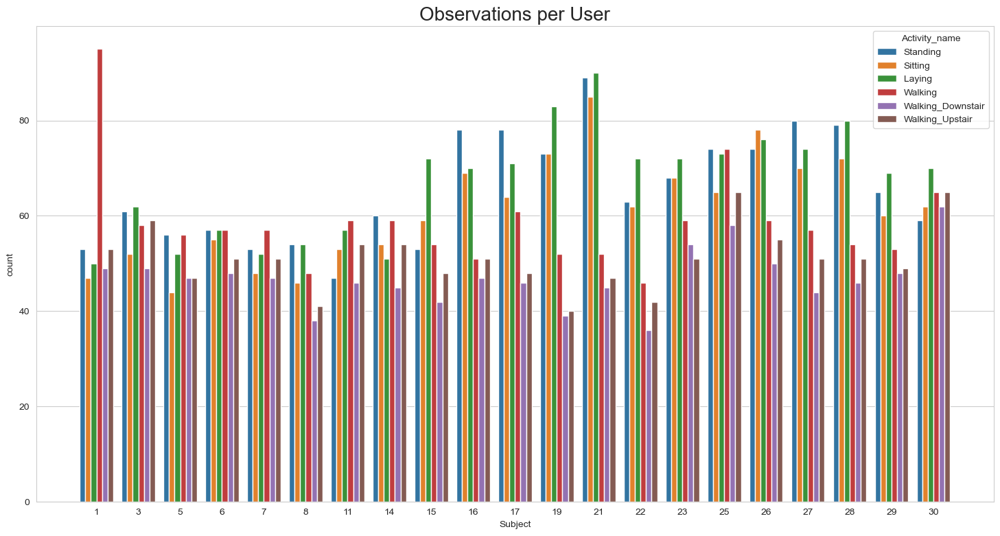

In [30]:
sns.set_style('whitegrid')
plt.figure(figsize=(18,9))
plt.title('Observations per User', fontsize=20)
sns.countplot(x='Subject', hue='Activity_name', data=train)
plt.plot()

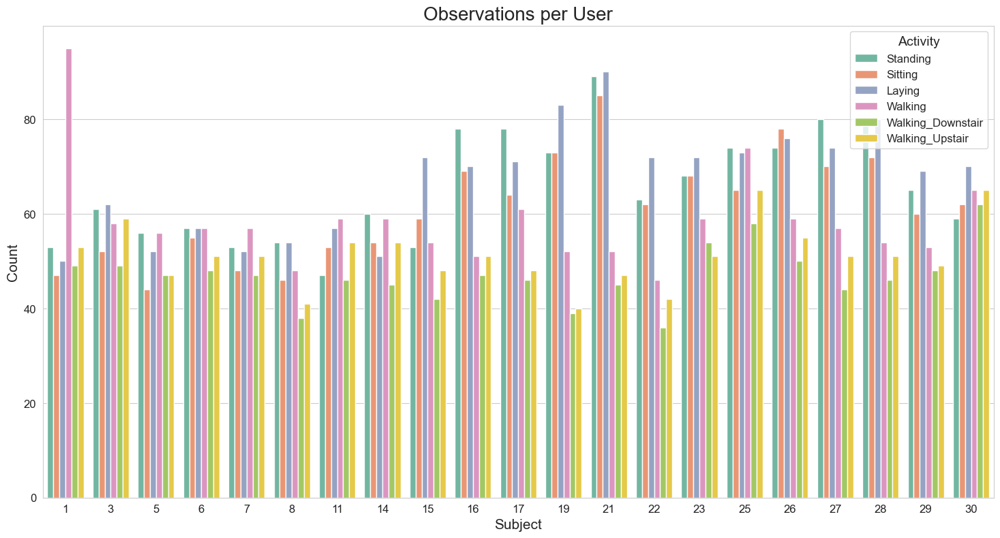

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
sns.set_style('whitegrid')
plt.figure(figsize=(18, 9))

# Create the count plot
sns.countplot(
    x='Subject',
    hue='Activity_name',
    data=train,
    palette='Set2'  # Use a visually appealing color palette
)

# Customize the plot
plt.title('Observations per User', fontsize=20)
plt.xlabel('Subject', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Activity', fontsize=12, title_fontsize=14, loc='upper right')

# Show the plot
plt.show()


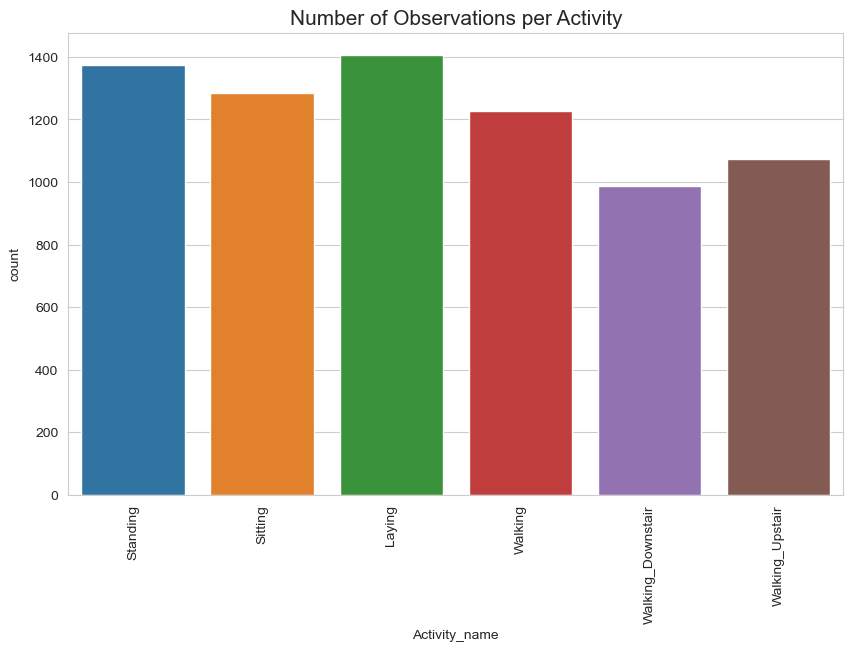

In [61]:
# Let's check number of observations per label
# Set up the figure size for better readability if needed
plt.figure(figsize=(10, 6))

# Plot count of observations per activity
sns.countplot(x="Activity_name", data=train)

# Add title and rotate x-axis labels for clarity
plt.title("Number of Observations per Activity", fontsize=15)
plt.xticks(rotation=90)
plt.show()


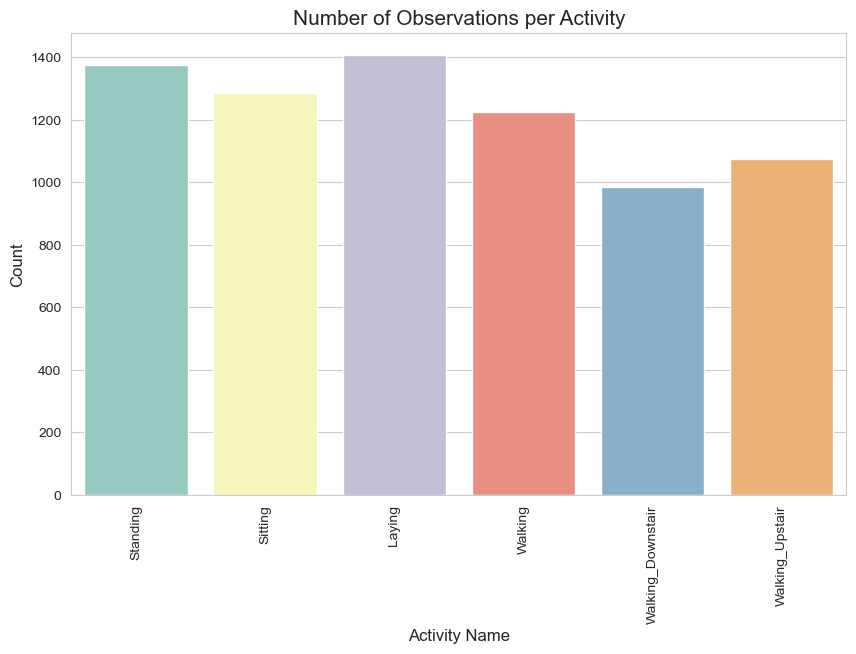

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the figure size for better readability
plt.figure(figsize=(10, 6))

# Plot count of observations per activity
sns.countplot(x="Activity_name", data=train, palette="Set3")

# Add title and rotate x-axis labels for clarity
plt.title("Number of Observations per Activity", fontsize=15)
plt.xlabel("Activity Name", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=90)
plt.show()


**changing the column names**

In [62]:
columns = train.columns

In [63]:
columns

Index(['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z',
       'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X',
       ...
       'angle(tBodyAccMean,gravity)', 'angle(tBodyAccJerkMean),gravityMean)',
       'angle(tBodyGyroMean,gravityMean)',
       'angle(tBodyGyroJerkMean,gravityMean)', 'angle(X,gravityMean)',
       'angle(Y,gravityMean)', 'angle(Z,gravityMean)', 'Subject', 'Activity',
       'Activity_name'],
      dtype='object', length=564)

In [64]:
# Removing (), - and , from column names in one step
columns = columns.str.replace('[(),-]', '', regex=True)

# Assign cleaned columns back to DataFrames
train.columns = columns
test.columns = columns


In [65]:
train.columns

Index(['tBodyAccmeanX', 'tBodyAccmeanY', 'tBodyAccmeanZ', 'tBodyAccstdX',
       'tBodyAccstdY', 'tBodyAccstdZ', 'tBodyAccmadX', 'tBodyAccmadY',
       'tBodyAccmadZ', 'tBodyAccmaxX',
       ...
       'angletBodyAccMeangravity', 'angletBodyAccJerkMeangravityMean',
       'angletBodyGyroMeangravityMean', 'angletBodyGyroJerkMeangravityMean',
       'angleXgravityMean', 'angleYgravityMean', 'angleZgravityMean',
       'Subject', 'Activity', 'Activity_name'],
      dtype='object', length=564)

In [67]:
train.to_csv('UCI_HAR_Dataset/csv_files/train.csv', index=False)
test.to_csv('UCI_HAR_Dataset/csv_files/test.csv', index=False)

# Exploratory Data Analysis

C:\Users\nagun\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\nagun\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\nagun\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\nagun\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

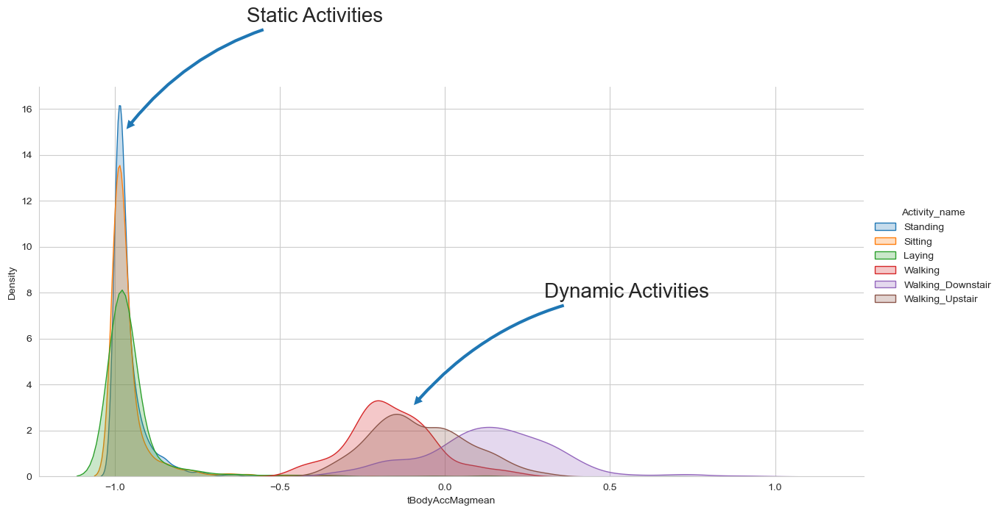

In [77]:
# Based on the activities performed we can differentiate based on the whether the activity is static or dynamic
#Static:Sitting,Standing and Laying Down
#Dynamic: Walking,Walking-up,Walking-down

facetgrid = sns.FacetGrid(data=train, hue='Activity_name', height=6, aspect=2)
facetgrid.map(sns.kdeplot, 'tBodyAccMagmean', fill=True).add_legend()

# Adding annotations to the plot
plt.annotate("Static Activities", xy=(-0.97, 15), xytext=(-0.6, 20), size=20,
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.2"))

plt.annotate("Dynamic Activities", xy=(-0.1, 3), xytext=(0.3, 8), size=20,
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.2"))

# Display the plot
plt.show()


In [78]:
# Taking datapoint of each activity to a different Dataframe

df1 = train[train['Activity'] == 1]
df2 = train[train['Activity'] == 2]
df3 = train[train['Activity'] == 3]
df4 = train[train['Activity'] == 4]
df5 = train[train['Activity'] == 5]
df6 = train[train['Activity'] == 6]

C:\Users\nagun\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\nagun\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\nagun\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\nagun\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

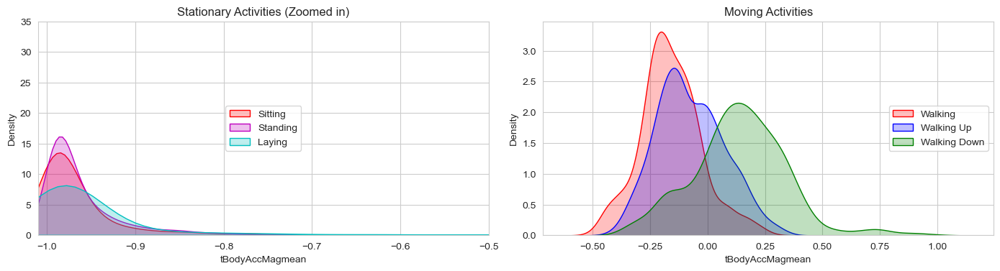

In [79]:
# Set the figure size
plt.figure(figsize=(14,7))

# Plot Stationary Activities with a zoomed-in axis
plt.subplot(2, 2, 1)
plt.title('Stationary Activities (Zoomed in)')
sns.kdeplot(df4['tBodyAccMagmean'], color='r', label='Sitting', fill=True)
sns.kdeplot(df5['tBodyAccMagmean'], color='m', label='Standing', fill=True)
sns.kdeplot(df6['tBodyAccMagmean'], color='c', label='Laying', fill=True)
plt.axis([-1.01, -0.5, 0, 35])
plt.legend(loc='center')

# Plot Moving Activities
plt.subplot(2, 2, 2)
plt.title('Moving Activities')
sns.kdeplot(df1['tBodyAccMagmean'], color='red', label='Walking', fill=True)
sns.kdeplot(df2['tBodyAccMagmean'], color='blue', label='Walking Up', fill=True)
sns.kdeplot(df3['tBodyAccMagmean'], color='green', label='Walking Down', fill=True)
plt.legend(loc='center right')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()


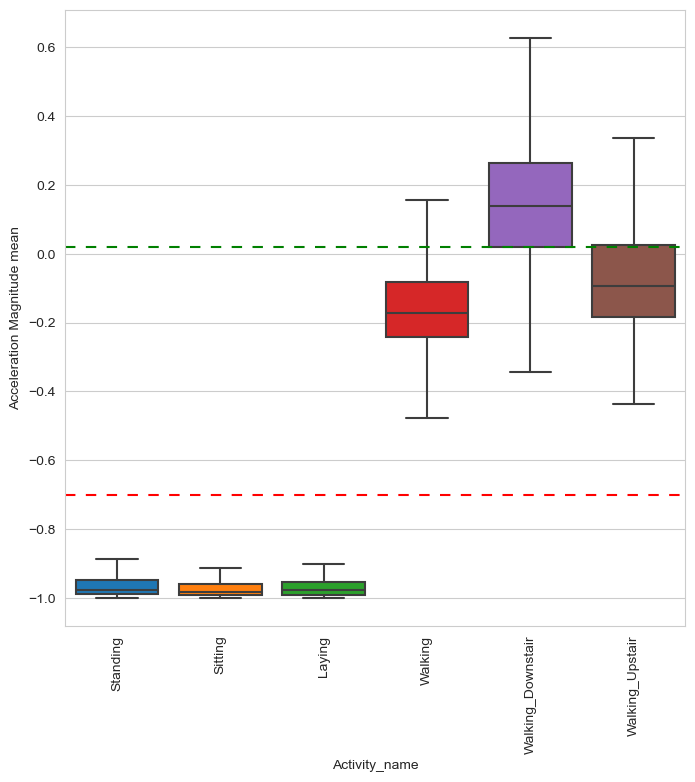

In [81]:
# Let's plot a boxplot to check the same

plt.figure(figsize=(8,8))
sns.boxplot(x='Activity_name', y='tBodyAccMagmean',data=train, showfliers=False, saturation=1)
plt.ylabel('Acceleration Magnitude mean')
plt.xticks(rotation=90)
plt.axhline(y=-0.7, xmin=0.0, xmax=1.0, dashes=(5,5), c='r')
plt.axhline(y=0.02, xmin=0.0, xmax=1.0, dashes=(5,5), c='g')
plt.show()

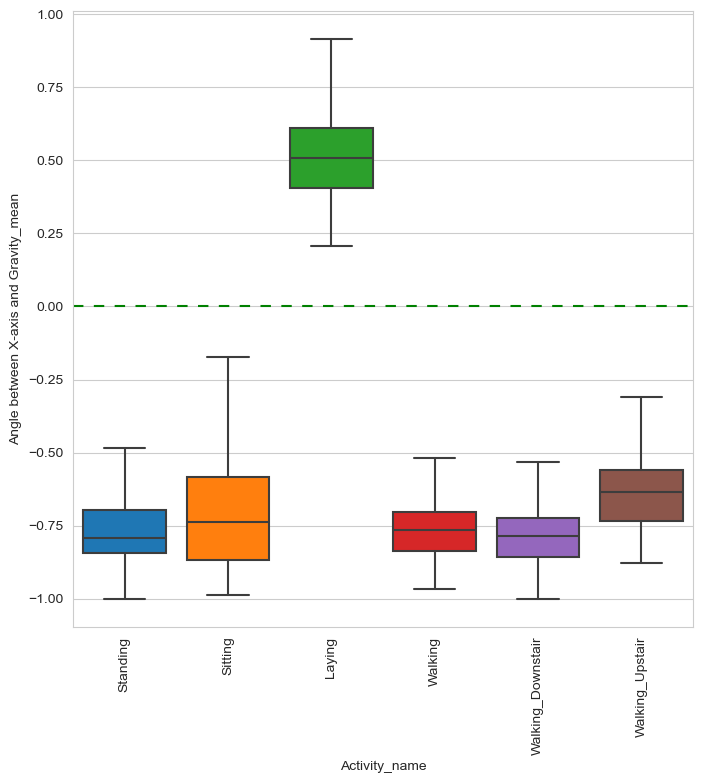

In [83]:
# Let's plot a boxplot for activity_name and angleXgravityMean

plt.figure(figsize=(8,8))
sns.boxplot(x='Activity_name', y='angleXgravityMean',data=train, showfliers=False, saturation=1)
plt.ylabel('Angle between X-axis and Gravity_mean')
plt.xticks(rotation=90)
plt.axhline(y=0.0, xmin=0.0, xmax=1.0, dashes=(5,5), c='g')
plt.show()

So,If angle between X-axis and Gravity Mean is greater than 0 then the activity is laying

# Applying t-SNE to better visualize the data

In [84]:
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
from sklearn.manifold import TSNE

In [89]:
# Defining a function that takes input and plots the t-SNE 

def perform_tsne(X_data, y_data, perplexities):
    for index, perplexity in enumerate(perplexities):
        # perform t-SNE
        X_reduced = TSNE(perplexity=perplexity).fit_transform(X_data)
        
        # Getting required data for Seaborn plot
        print('Creating plot for this t-SNE Visualization..')
        df = pd.DataFrame({'X':X_reduced[:,0], 'y':X_reduced[:,1], 'label':y_data})
        
        # Plotting the data
        sns.lmplot(data=df, x='X', y='y', hue='label', fit_reg=False, height=8,\
                   palette="Set1",markers=['o', '1','2','^','v','s'])
        plt.title("Perplexity : {}".format(perplexity))
        plt.show()
        print('Done')

Creating plot for this t-SNE Visualization..


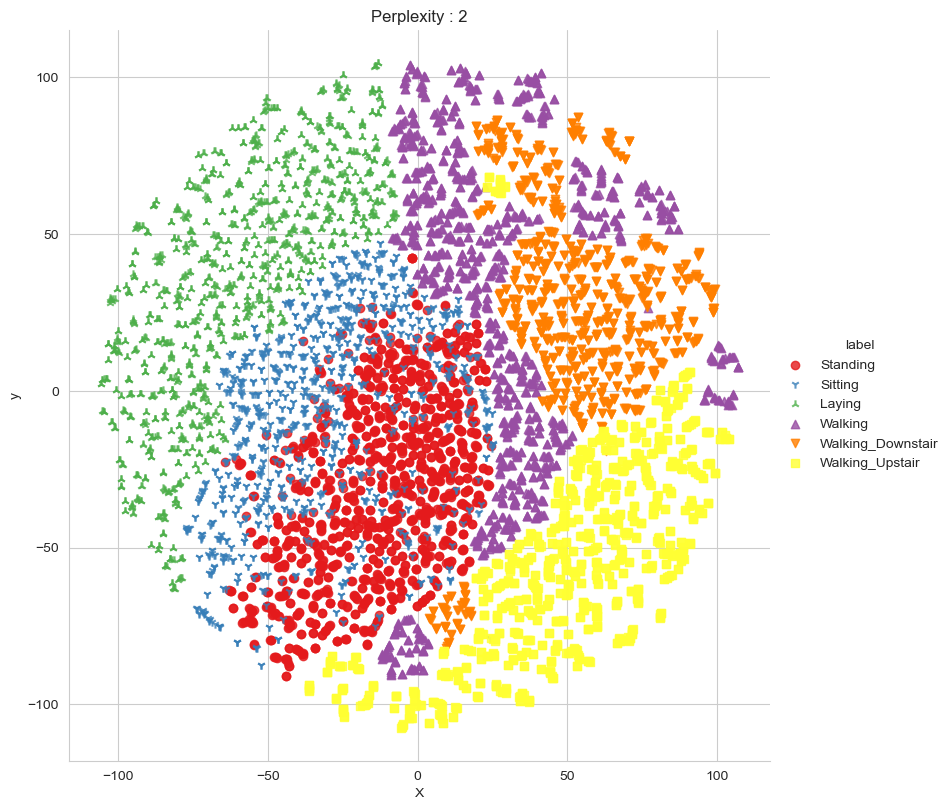

Done
Creating plot for this t-SNE Visualization..


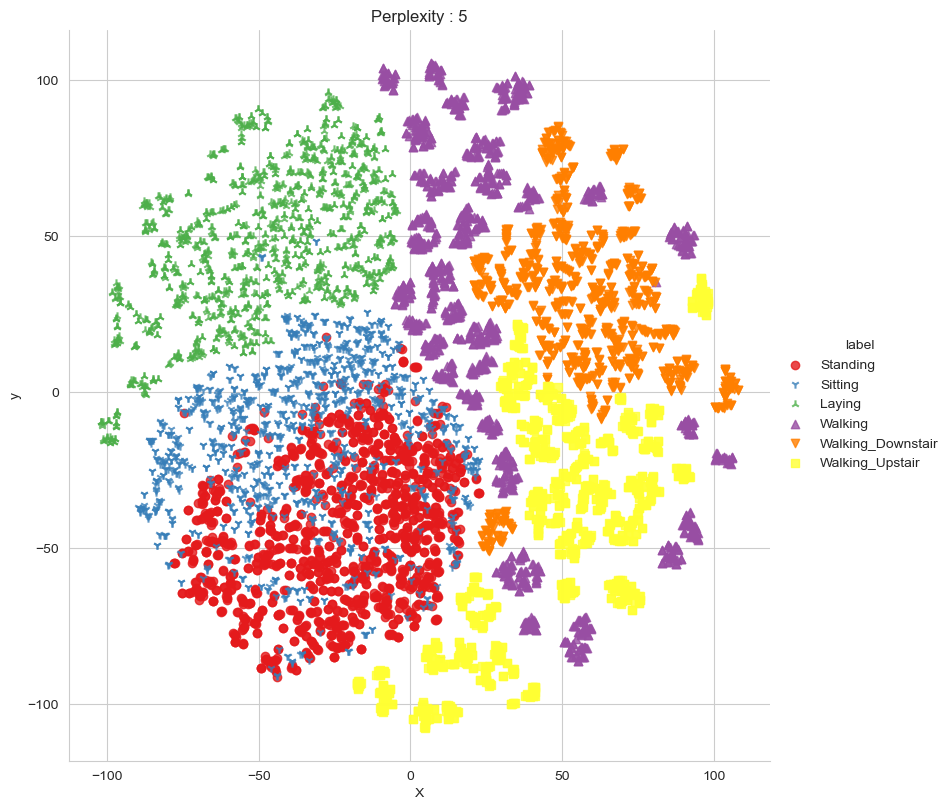

Done
Creating plot for this t-SNE Visualization..


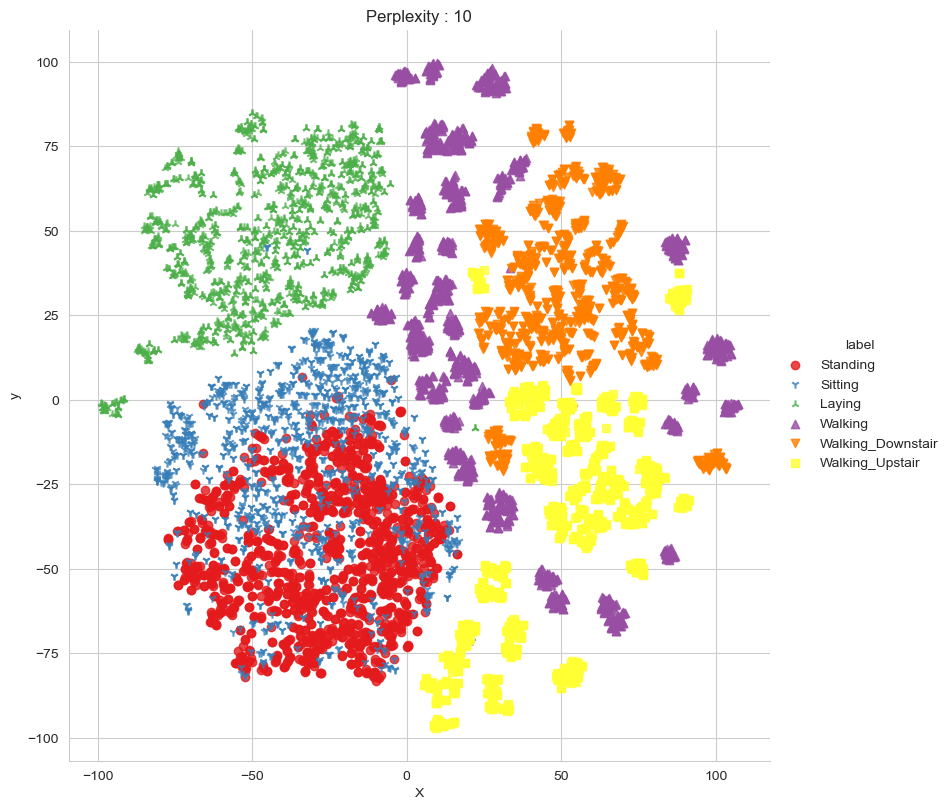

Done
Creating plot for this t-SNE Visualization..


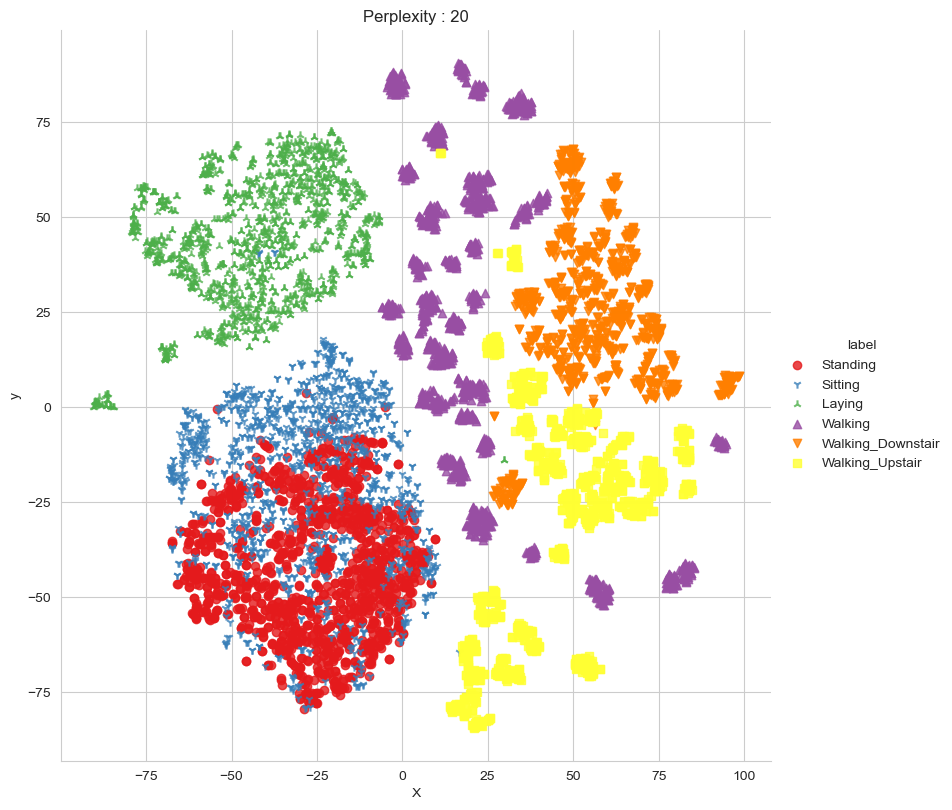

Done
Creating plot for this t-SNE Visualization..


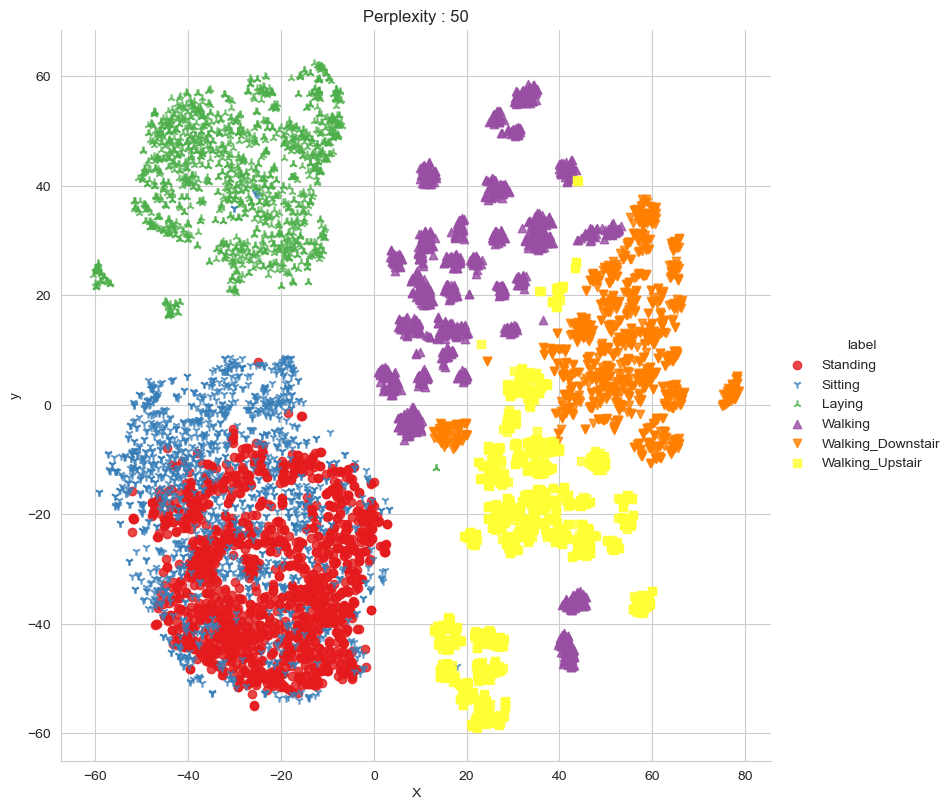

Done


In [90]:
X_tsne = train.drop(['Subject', 'Activity','Activity_name'], axis=1)
y_tsne = train['Activity_name']
perform_tsne(X_data = X_tsne,y_data=y_tsne, perplexities =[2,5,10,20,50])

Creating Plotly visualization for Perplexity: 2


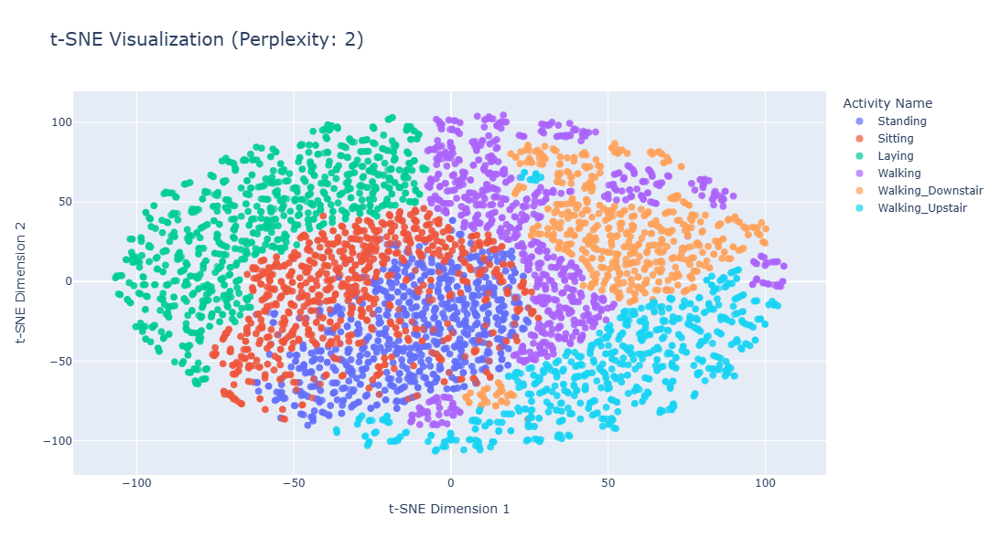

Done
Creating Plotly visualization for Perplexity: 5


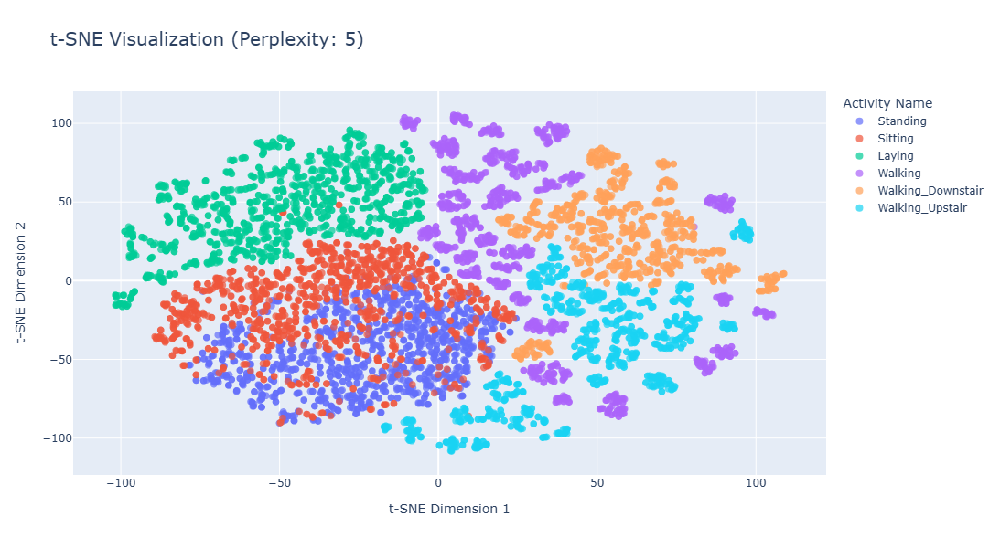

Done
Creating Plotly visualization for Perplexity: 10


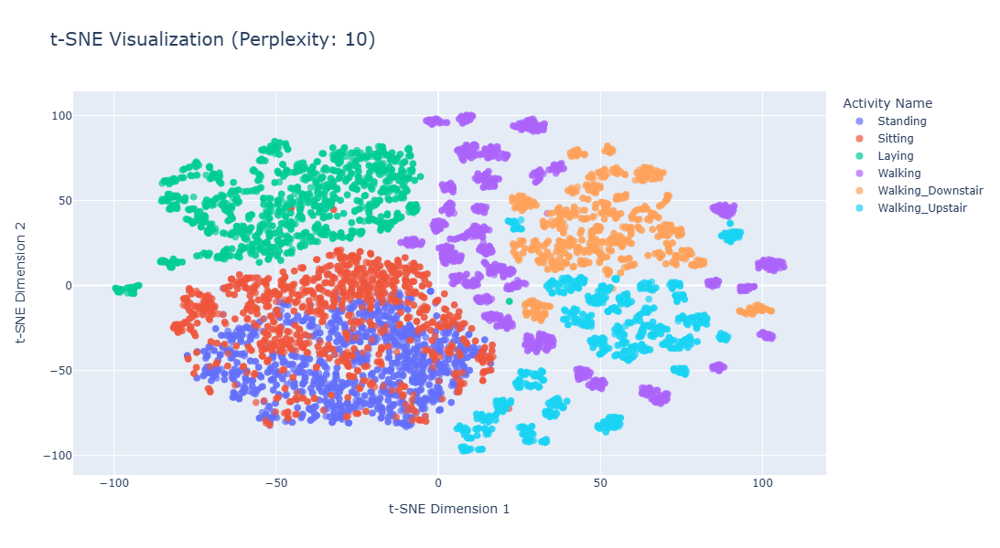

Done
Creating Plotly visualization for Perplexity: 20


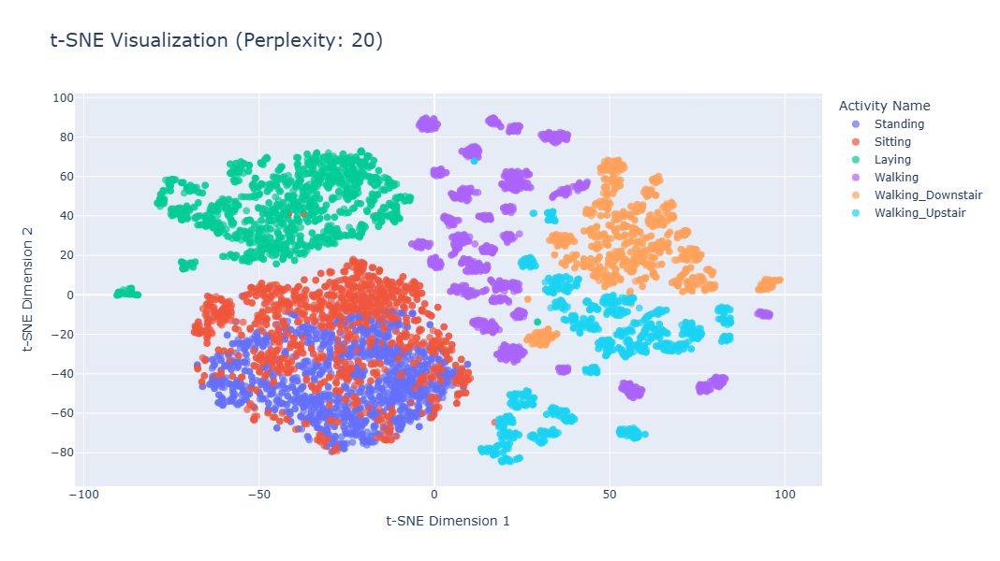

Done
Creating Plotly visualization for Perplexity: 50


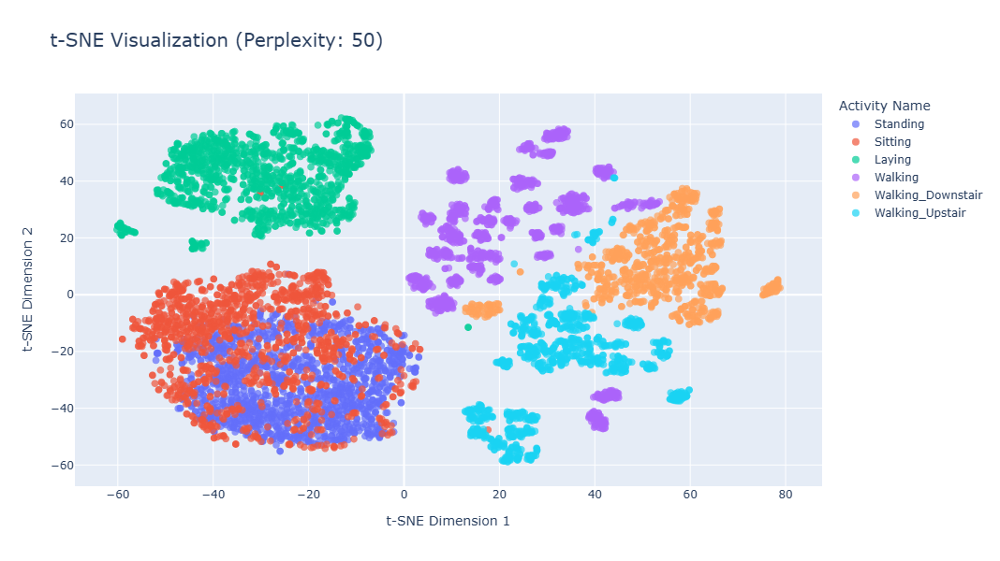

Done


In [36]:
from sklearn.manifold import TSNE
import pandas as pd
import plotly.express as px

def perform_tsne_plotly(X_data, y_data, perplexities):
    for perplexity in perplexities:
        # Perform t-SNE with specified perplexity
        X_reduced = TSNE(perplexity=perplexity, random_state=42).fit_transform(X_data)
        
        # Prepare DataFrame for visualization
        print(f'Creating Plotly visualization for Perplexity: {perplexity}')
        df = pd.DataFrame({
            'X': X_reduced[:, 0], 
            'Y': X_reduced[:, 1], 
            'Activity': y_data
        })
        
        # Create an interactive scatter plot
        fig = px.scatter(
            df, x='X', y='Y', color='Activity',
            title=f"t-SNE Visualization (Perplexity: {perplexity})",
            labels={'Activity': 'Activity Name'},
            hover_data=['Activity']
        )
        # Customize the layout
        fig.update_traces(marker=dict(size=8, opacity=0.7))
        fig.update_layout(
            title_font_size=20,
            legend_title=dict(font=dict(size=14)),
            xaxis_title="t-SNE Dimension 1",
            yaxis_title="t-SNE Dimension 2",
            height=600,
            width=800
        )
        
        # Display the interactive plot
        fig.show()
        print('Done')

# Prepare the data for t-SNE
X_tsne = train.drop(['Subject', 'Activity', 'Activity_name'], axis=1)
y_tsne = train['Activity_name']

# Call the function with a list of perplexities
perform_tsne_plotly(X_data=X_tsne, y_data=y_tsne, perplexities=[2, 5, 10, 20, 50])
